In [36]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MaxAbsScaler
pd.options.mode.chained_assignment = None 

In [82]:
df = pd.read_csv('Downloads/bquxjob_3f568f64_1915bb4070a.csv')
'''
SELECT Connection_CellConnectionStatus, count(1),EXTRACT(DAYOFYEAR FROM Connection_Start) as date,Location_City FROM `reportdataexternal-ofcom.Standard_US.UnitedKingdom_Last30Days`  group by Connection_CellConnectionStatus,date, Location_City order by date asc
'''

'\nSELECT Connection_CellConnectionStatus, count(1),EXTRACT(DAYOFYEAR FROM Connection_Start) as date,Location_City FROM `reportdataexternal-ofcom.Standard_US.UnitedKingdom_Last30Days`  group by Connection_CellConnectionStatus,date, Location_City order by date asc\n'

In [83]:
df.head()

,Connection_CellConnectionStatus,f0_,date,Location_PostCodeDistrict
0,NOT_PERFORMED,3,169,LU7
1,NOT_PERFORMED,1,169,M27
2,NOT_PERFORMED,21,169,DN22
3,NOT_PERFORMED,5,169,TR14
4,NOT_PERFORMED,5,169,NR33


In [84]:
df['Location_City'] = df['Location_PostCodeDistrict']
del df['Location_PostCodeDistrict']

In [85]:
df.groupby('Connection_CellConnectionStatus').size().sort_values()

Connection_CellConnectionStatus
ERROR                               1
CONNECTION_SECONDARY_SERVING     4995
UNKNOWN                          6499
CONNECTION_PRIMARY_SERVING      55597
CONNECTION_NONE                 59838
NOT_PERFORMED                   98933
dtype: int64

In [86]:
statuses = pd.unique(df['Connection_CellConnectionStatus'].values)

In [42]:
for city in ['London', 'Birmingham','Manchester','Bath','Glasgow','Newport']:
    print(df[df['Location_City'] == city].shape)

(242, 4)
(202, 4)
(197, 4)
(0, 4)
(199, 4)
(157, 4)


In [87]:
districts = pd.unique(df['Location_City'].values)

(195.0, 230.0)

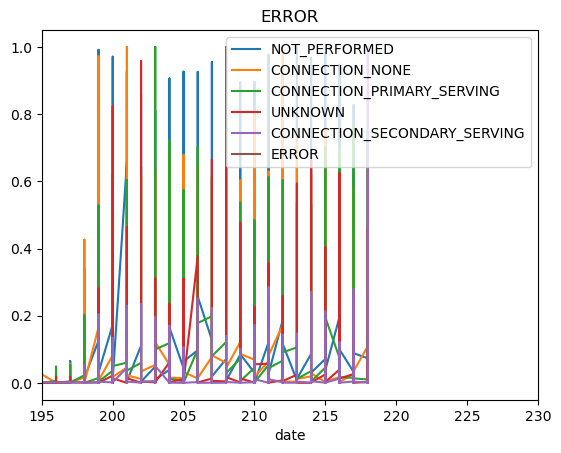

In [88]:
fig, ax = plt.subplots()

for st in statuses:
        subset = df[df['Connection_CellConnectionStatus'] == st]
        subset['f0_normed'] = subset['f0_'] / subset['f0_'].max()
        subset.plot(x = 'date', y = 'f0_normed', label=st, ax=ax)
        plt.title(st)
    
plt.xlim(195,230)

In [78]:
percentages.get('UNKNOWN')

0.08251703857867987

C:\Users\alex.rutherford\AppData\Local\Temp\ipykernel_18460\2007707235.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


ValueError: Unknown format code 's' for object of type 'float'

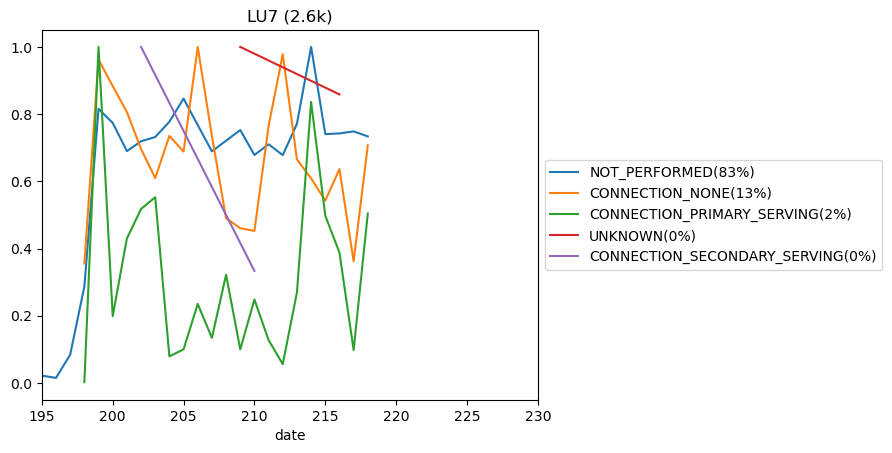

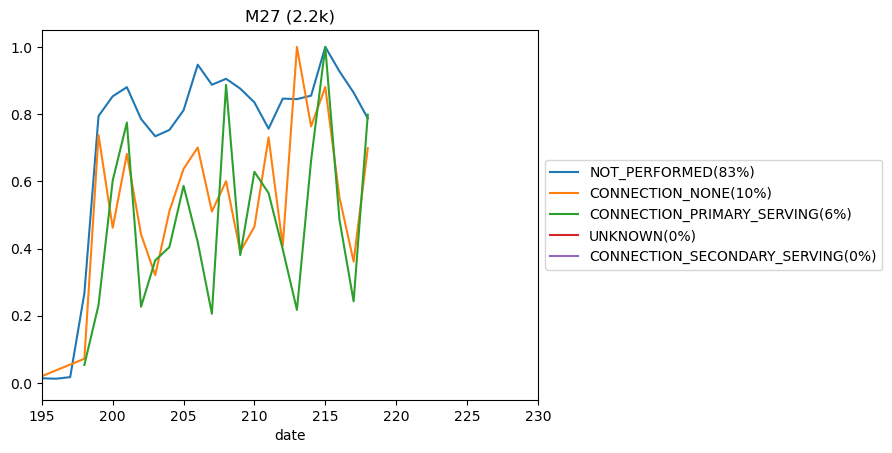

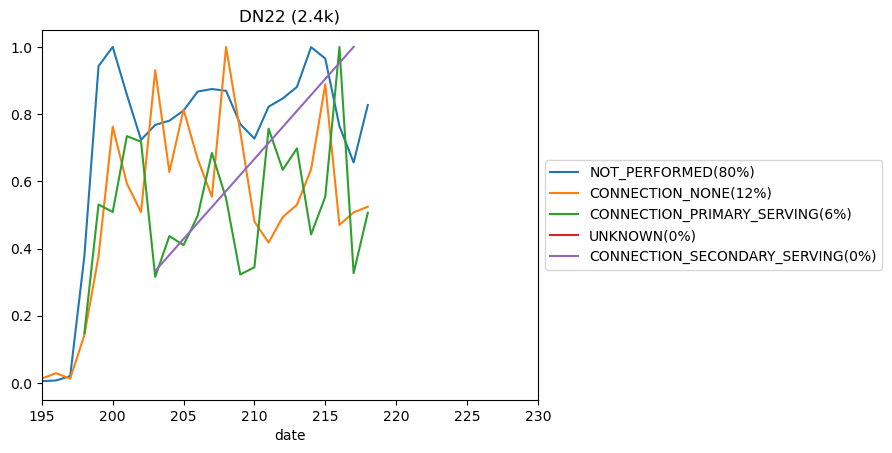

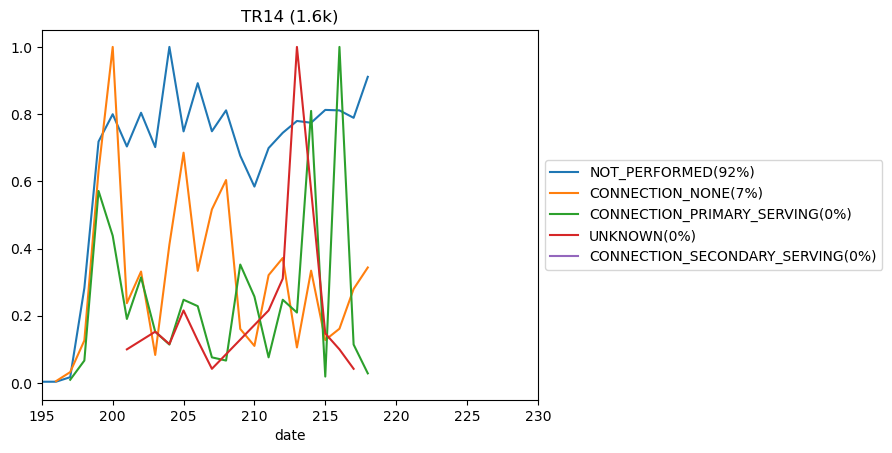

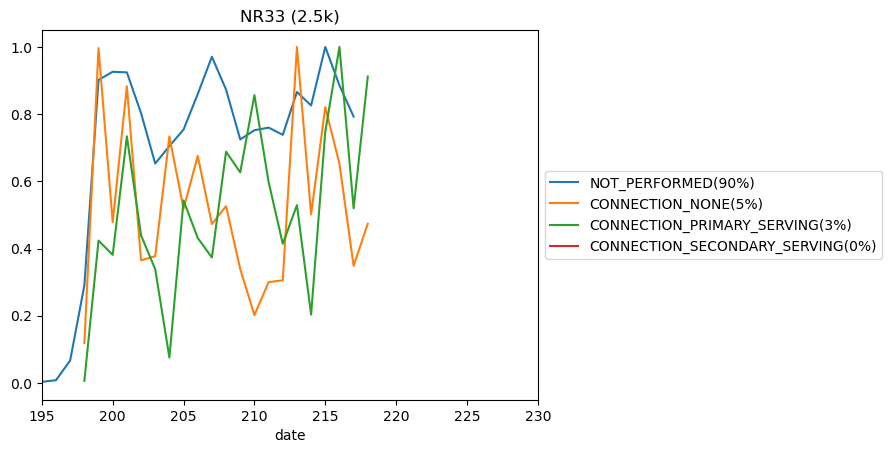

...

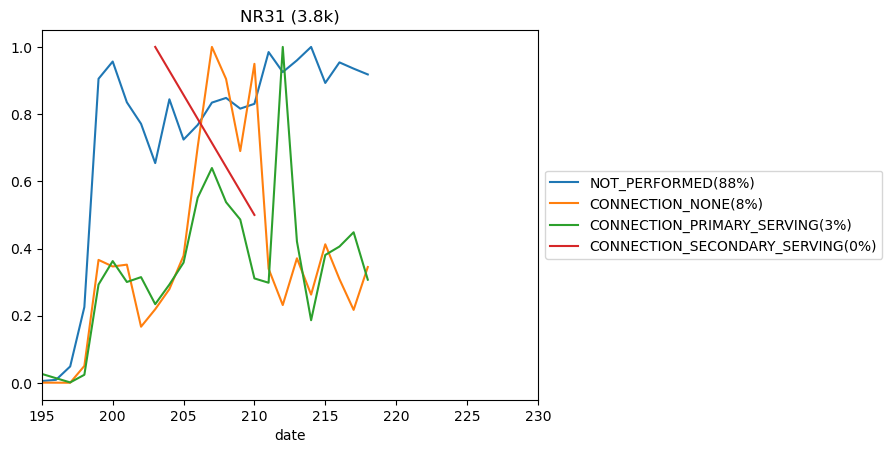

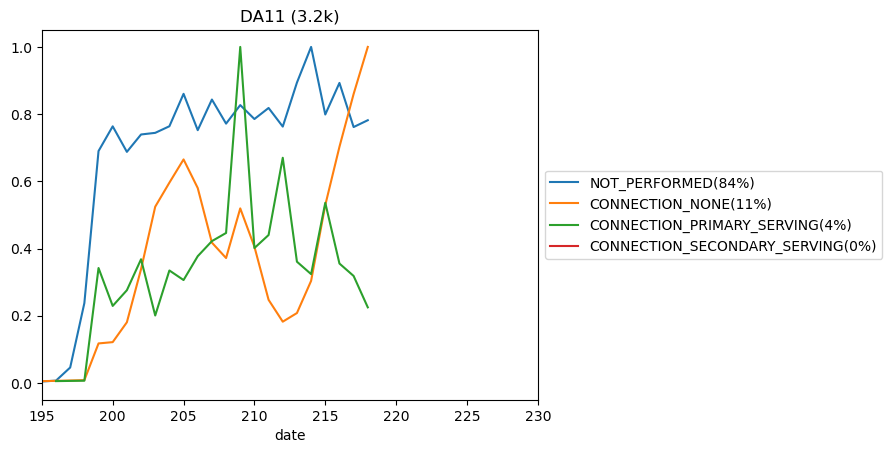

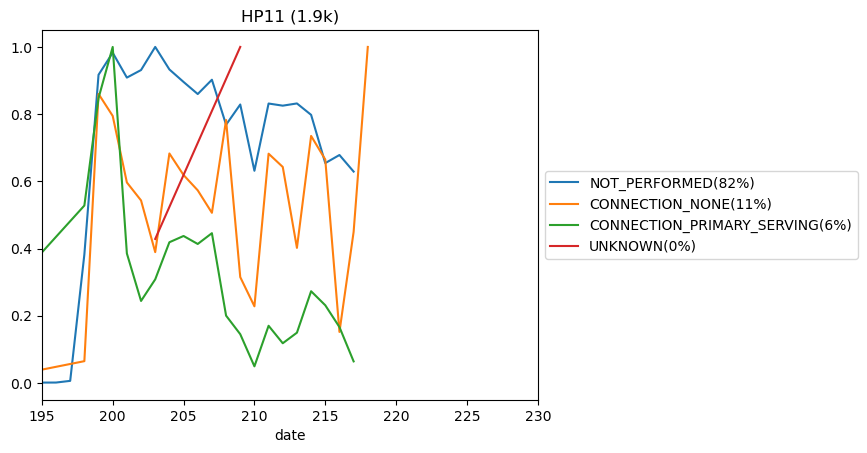

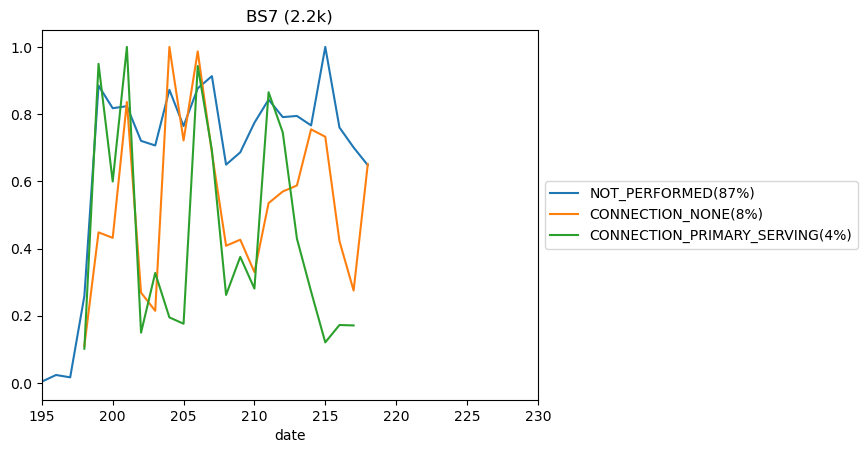

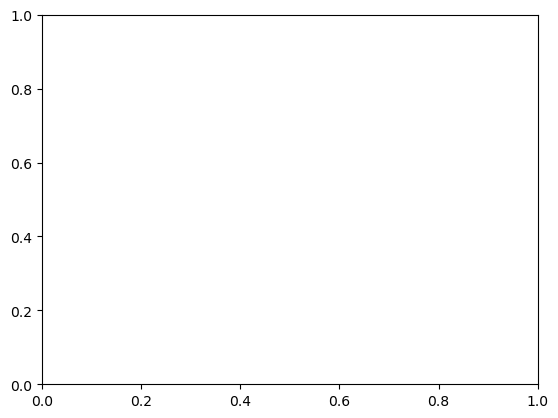

In [90]:
#for city in ['London', 'Birmingham','Manchester','Bath','Glasgow','Newport']:
for city in districts:

    print(city)
    
    fig, ax = plt.subplots()
    
    meanDaily = df[df['Location_City'] == city]['f0_'].mean()
    if not meanDaily:
        meanDaily = 0
    
    #print(meanDaily)

    percentages = df[df['Location_City'] == city].groupby('Connection_CellConnectionStatus')['f0_'].sum()
    percentages = 100 * percentages / percentages.sum()
    
    for st in statuses:
        subset = df[(df['Connection_CellConnectionStatus'] == st) & (df['Location_City'] == city)]
        subset['f0_normed'] = subset['f0_'] / subset['f0_'].max()
        percent = percentages.get(st)
        if percent:
            # Don't try to plot if missing
            subset.plot(x = 'date', y = 'f0_normed', label=st +'({:d}%)'.format(int(percent)), ax=ax)
    plt.title('{:s} ({:.1f}k)'.format(city,(meanDaily)/1000.))
    plt.xlim(195,230)
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))